# Diffusion

Diffusion is a technique for *generating* new images. In the diffusion process, we begin with random pixels and repeatedly remove "noise" from the image until we are left with an image we recognize. Ideally, the process would look something like the following: A cat on a bike slowly appears from random noise.

![](https://www.rtealwitter.com/deeplearning2023/images/noise-to-image.png)

Of course, removing such noise from an image is ostensibly a difficult task: How does the model know what noise to remove at each step? And how do we get training data? The key observation of diffusion is that, while going from noise to an image is challenging, going from an image to noise is quite easy: If we begin the process with a real image we already have, then we can add random noise to the image until the result becomes unrecognizable.

![](https://www.rtealwitter.com/deeplearning2023/images/image-to-noise.png)

Operationally, we provide one noisy image and train the model to predict the noise that was last added to it. Let's formulize the process in our three step recipe for machine learning:

1. **Model**. The model is an architecture that takes in a noisy image and predicts what noise was last applied.

2. **Loss**. The loss is the difference between the predicted noise and the actual noise. Of course, since we added the noise to the image, we actually do know what noise was last added and directly compare it to the prediction. We'll use the mean squared difference between the two as our loss criterion.

3. **Optimizer**. As usual, we run gradient descent on the parameter space of the model to minimize the loss.

In this lab, we will train a diffusion model on the MNIST data set. After getting a sense for how diffusion works, we will load pretrained models for *stable diffusion* and run them on prompts of your choice.



I have used chatgpt.com to refine my code

## Diffusion on MNIST

We will build a diffusion model on the relatively simpler data set of handwritten images.

As usual, we will load several helpful libraries.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F

### FashionMNIST

The MNIST data set consists of 28x28 black-and-white images of different Clothing and Fashion items. We will download the training set and count the number of images in the data set.

In [2]:
train_data = torchvision.datasets.FashionMNIST('dataset', train=True, download=True, transform=torchvision.transforms.ToTensor())

print(f'\nThere are {len(train_data)} images in the training set!')

100%|██████████| 26.4M/26.4M [00:02<00:00, 12.9MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 190kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 3.60MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 17.9MB/s]


There are 60000 images in the training set!


Since there are 60k images in the training set, we'll need a way to train on *batches* of them. For this purpose, we'll use the pytorch `DataLoader` and specify a batch size of 512 (we love powers of two and it [may help](https://stackoverflow.com/questions/44483233/is-using-batch-size-as-powers-of-2-faster-on-tensorflow) with parallelization).

In [3]:
batch_size = 512

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)

Before we begin building the architecture, let's take a look at the images in the data set.

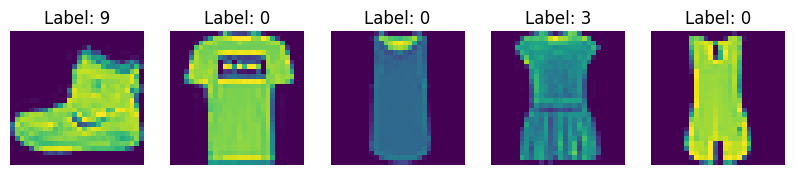

In [4]:
images, labels = next(iter(train_loader)) # load from the dataloader

plt.figure(figsize=(10,4))
for index in np.arange(0,5):
  plt.subplot(1,5,index+1)
  plt.axis('off')
  plt.title(f'Label: {labels[index].item()}')
  plt.imshow(images[index].squeeze().numpy())

As promised, we have clothing items. As a sanity check, what is the shape of `images` as defined above?

In [5]:
# Check that the shape of images makes sense.
# (batch_size, 1, 28, 28)
images.shape

torch.Size([512, 1, 28, 28])

The first step of diffusion is to generate the training data. We'll draw the random noise from the normal distribution. However, we'll have to choose the standard deviation of the noise and how many steps of noise to apply. In order to choose appropriate values, let's plot what the noising process does.

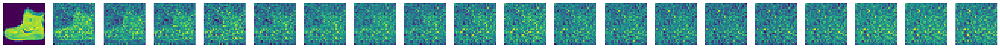

In [6]:
images, labels = next(iter(train_loader))
noisy_images = images

# The two hyperparameters we are choosing.
sigma = .35 # standard deviation
noise_steps = 20 # number of steps we apply noise

plt.figure(figsize=(noise_steps * 2, 10))
for i in range(noise_steps):
  # Draw noise from a normal distribution with standard deviation sigma.
  noise = torch.normal(0, sigma, images.shape)
  plt.subplot(1,noise_steps,i+1)
  plt.imshow(noisy_images[0].squeeze())
  plt.axis('off')
  # Add the noise to the image.
  noisy_images = noise + noisy_images

After playing with the hyperparemeters, I set `sigma`=.35 and `noise_steps`=20. I chose these values with the following considerations in mind:

* Since the diffusion process will begin with noise, it's important that the training data includes noisy images that look like noise (i.e. no indication of the starting image).

* Simultaneously, there should be lots of images where the starting image is somewhat apparent. In this way, we train the model to remove noise both on images that look like noise *and* images that somewhat resemble the underlying image.

Of course, there are lots of other hyperparameter pairs that satisfy these constraints and you are welcome to explore for them.

### Architecture

Training a diffusion model is particularly finicky. To make this model work, there are several hacks that I employed:

* The output of the diffusion model is normalized to have mean 0 and standard deviation `sigma`. The reasoning is that this makes the output more closely resemble noise so we can make the training process faster.

* In addition to the image, the model takes in the number of noise steps that have been applied to the image. This gives it information on how much noise it should expect. Intuitively, this makes its task easier since the noise it removes should depend on how much noise has been added.

* The model takes in the label of the image. This extra information guides it through the diffusion process: for example, removing noise from a 9 is a different task than removing noise from a 7.

I found that each of these additions was necessary to training a successful diffusion model efficiently. If you are feeling adventurous, you're welcome to try removing these additions and/or adding your own.

Let's begin by defining the normalization function. We're simplying going to subtract the mean, divide by the standard deviation, and multiply by `sigma`. However, because we are applying this operation to each image separately in a batch, we need to be slightly careful about the dimensions.

In [7]:
def normalize(x, sigma):
  # x is (batch_size, 28*28)
  mean = x.mean(dim=-1).view(-1, 1)
  # mean is (batch_size, 1) i.e. a different mean for each image
  std = x.std(dim=-1).view(-1,1)
  # std is (batch_size, 1) i.e. a different standard deviation for each image
  return (x-mean) / std * sigma

We're now ready to define the diffusion architecture. Note that we will pass in they hyperparameters `sigma` and `noise_steps` when we initialize the model. In addition, we will actually use a very simple two layer linear architecture. There will be about $(28 \cdot 28)^2 = 614656$ parameters which, since the images are small, is relatively mangeable. When we pass them in, we will [one-hot](https://en.wikipedia.org/wiki/One-hot) the amount of noise and the number of labels.

In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [9]:
class Diffuser(nn.Module):
  def __init__(self, sigma, noise_steps):
    super(Diffuser, self).__init__()
    # Recall the input is the image,
    # the amount of noise applied (this will be one-hot encoded),
    # and the number of labels (this will also be one-hot encoded).
    self.layers = nn.Sequential(
      nn.Linear(28*28+noise_steps+10, 28*28),
      nn.ReLU(),
      nn.Linear(28*28, 28*28)
    )
    self.sigma = sigma
    self.noise_steps = noise_steps

  def forward(self, images, noise_level, labels):
    # Convert image from (batch_size, 1, 28, 28) to (batch_size, 28*28) using .view
    images = images.view(-1, 28*28)
    # Combine the image with the noise level and labels.
    # We one hot encode both using F.one_hot
    noise_level_encoding = F.one_hot(
        torch.tensor([noise_level]*images.shape[0]), num_classes = self.noise_steps
    ).to(device)
    labels_encoding = F.one_hot(labels, num_classes = 10).to(device)
    # Concatenate the three inputs in a batch of long vectors
    x = torch.cat((images, noise_level_encoding, labels_encoding), 1)
    # The shape should now be (batch_size, 28*28+noise_steps+10)
    # Feed the input through the layers.
    x = self.layers(x)
    # Normalize x using our normalize function
    x = normalize(x, self.sigma)
    # Reformat the output so it is (batch_size, 1, 28, 28) using .view
    x = x.view(-1, 1, 28, 28)
    return x

Now we are ready to initialize the model, optimizer, and criterion. So that we can train faster on the GPU, we will also define the device. To use the GPU on colab, make sure that Runtime > Change runtime type > Hardware accelerator is on GPU.

In [10]:
num_epochs=25
model = Diffuser(sigma, noise_steps).to(device)
optimizer = torch.optim.Adam(model.parameters(), 1)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.5, total_iters=num_epochs)

We'll also want to sample noise efficiently on the GPU. To do this, we'll define a normal distribution with standard deviation `sigma`.

In [11]:
# Define unit_normal as an instance of torch.distributions.Normal
# and put its parameters (loc and scale) on the device.
unit_normal = torch.distributions.Normal(0, sigma)
unit_normal.loc = unit_normal.loc.to(device)
unit_normal.scale = unit_normal.scale.to(device)

So that we can visualize how the model is doing during training, let's write an evaluation function. The function will sample random noise and, guided by each label, use the model to repeatedly remove noise from the image for `noise_steps` iterations.

The initial noise will be sampled from a mean-centered normal distribution with standard deviation `sigma` `noise_steps`^1/2. (This is because of a [special property](https://en.wikipedia.org/wiki/Sum_of_normally_distributed_random_variables#:~:text=This%20means%20that%20the%20sum,squares%20of%20the%20standard%20deviations) of the sum of normal distributions.)

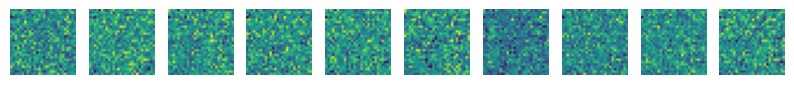

In [12]:
def evaluate(model, noise_steps):
  # Sample noisy images.
  noisy_images = unit_normal.sample((10,1,28,28))*np.sqrt(noise_steps)
  # Initialize labels.
  labels = torch.tensor([i for i in range(10)])
  plt.figure(figsize=(10, 5))
  # Remove noise from the images.
  for noise_step in range(noise_steps):
    # Why is noise level defined as below?
    noise_level = noise_steps - noise_step - 1
    # Apply the model without keeping track of gradient.
    with torch.no_grad():
      noise = model(noisy_images, noise_level, labels)
    noisy_images -= noise
  # Plot the resulting images.
  for i in range(10):
    plt.subplot(1, 10, i+1)
    plt.imshow(noisy_images[i].cpu().squeeze())
    plt.axis('off')
  plt.show()

evaluate(model, noise_steps)

As we expect, the untrained model just produces noise. Let's see if we can do any better after training.

## (a) Training the Diffuser model on FashionMNIST

/tmp/ipython-input-3304560906.py:10: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  less_noisy = images + unit_normal.sample(images.shape) * np.sqrt(noise_level)


Epoch: 0 	 Loss: 370.8293928653002


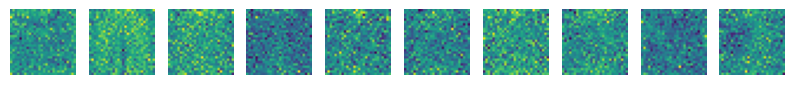

Epoch: 1 	 Loss: 370.7253232765943


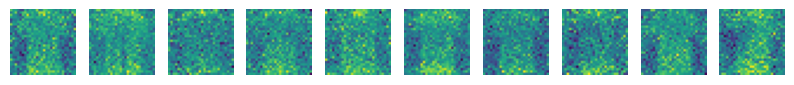

Epoch: 2 	 Loss: 370.023224927485


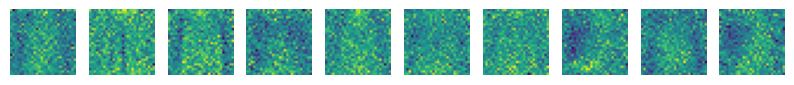

Epoch: 3 	 Loss: 370.361568165943


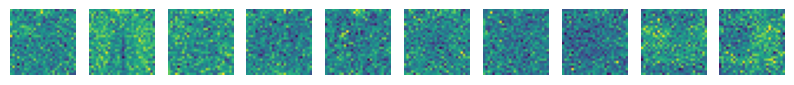

Epoch: 4 	 Loss: 370.0519152227789


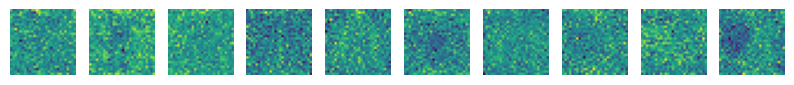

Epoch: 5 	 Loss: 370.05883282981813


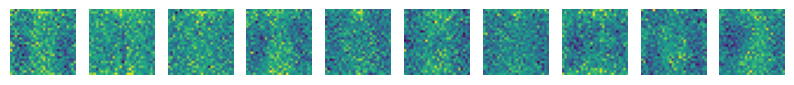

Epoch: 6 	 Loss: 369.89651986025274


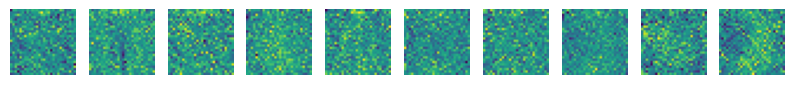

Epoch: 7 	 Loss: 369.6599688474089


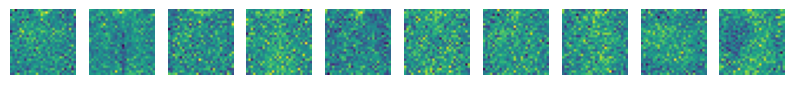

Epoch: 8 	 Loss: 369.75476870313287


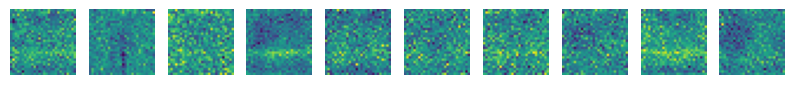

Epoch: 9 	 Loss: 369.6484240870923


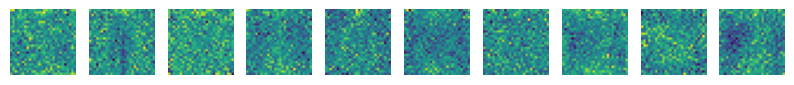

Epoch: 10 	 Loss: 369.5119256991893


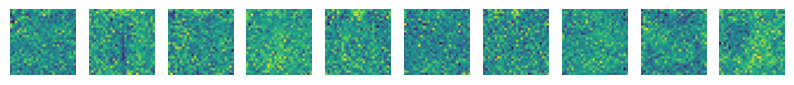

Epoch: 11 	 Loss: 369.21462696045637


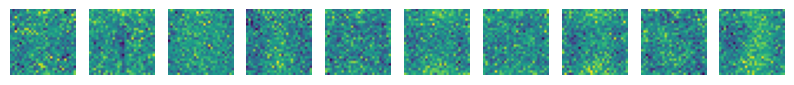

Epoch: 12 	 Loss: 369.4030436575413


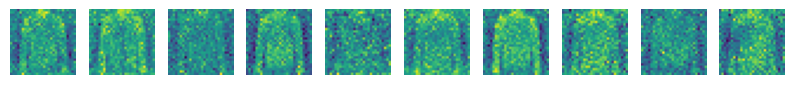

Epoch: 13 	 Loss: 369.0335701331496


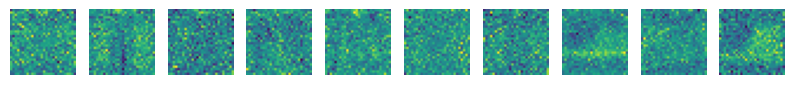

Epoch: 14 	 Loss: 369.25341714918613


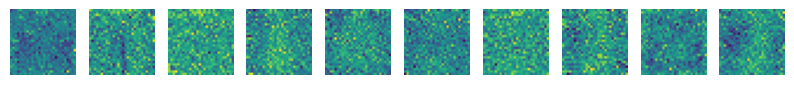

Epoch: 15 	 Loss: 368.9188839793205


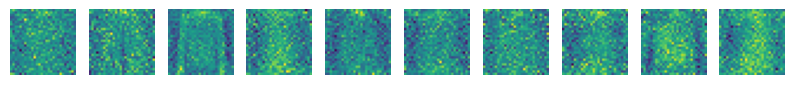

Epoch: 16 	 Loss: 368.98937620967627


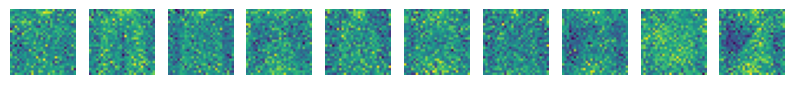

Epoch: 17 	 Loss: 369.05289773084223


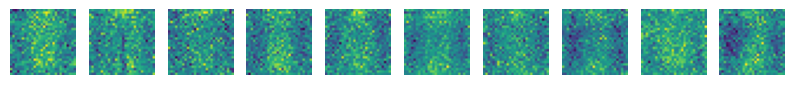

Epoch: 18 	 Loss: 368.7297257054597


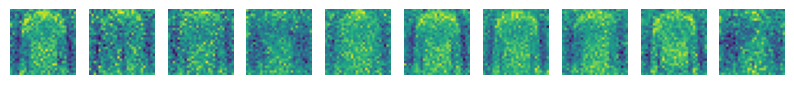

Epoch: 19 	 Loss: 368.5617127493024


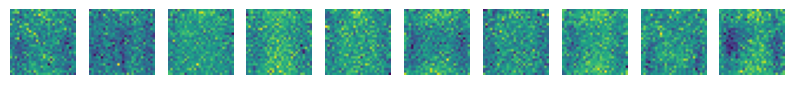

Epoch: 20 	 Loss: 368.51836140826344


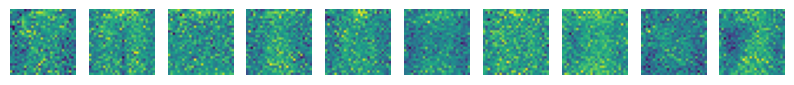

Epoch: 21 	 Loss: 368.7510508019477


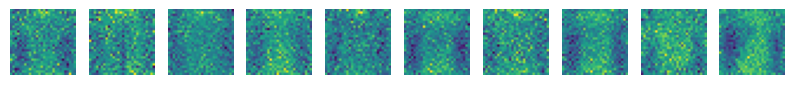

Epoch: 22 	 Loss: 368.21638361364603


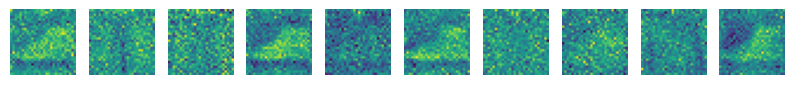

Epoch: 23 	 Loss: 368.443316757679


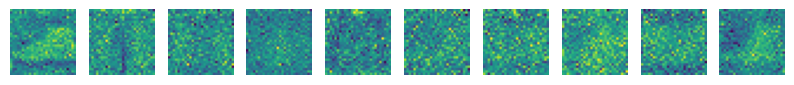

Epoch: 24 	 Loss: 368.3836240004748


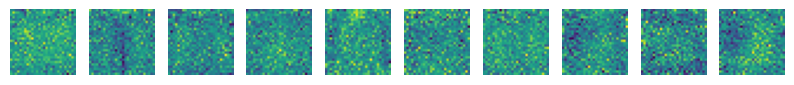

In [14]:
epoch_losses = []

for epoch in range(num_epochs):
  epoch_loss = 0
  i = 0
  for images, labels in train_loader:
    i = i+1
    images = images.to(device)
    for noise_level in torch.randperm(noise_steps):
      less_noisy = images + unit_normal.sample(images.shape) * np.sqrt(noise_level)
      one_step_noise = unit_normal.sample(images.shape)
      more_noisy = less_noisy + one_step_noise
      output = model(more_noisy, noise_level, labels)
      loss = criterion(output, one_step_noise)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      epoch_loss += loss.item()
  epoch_losses.append(epoch_loss)
  print(f'Epoch: {epoch} \t Loss: {epoch_loss}')
  evaluate(model, noise_steps)

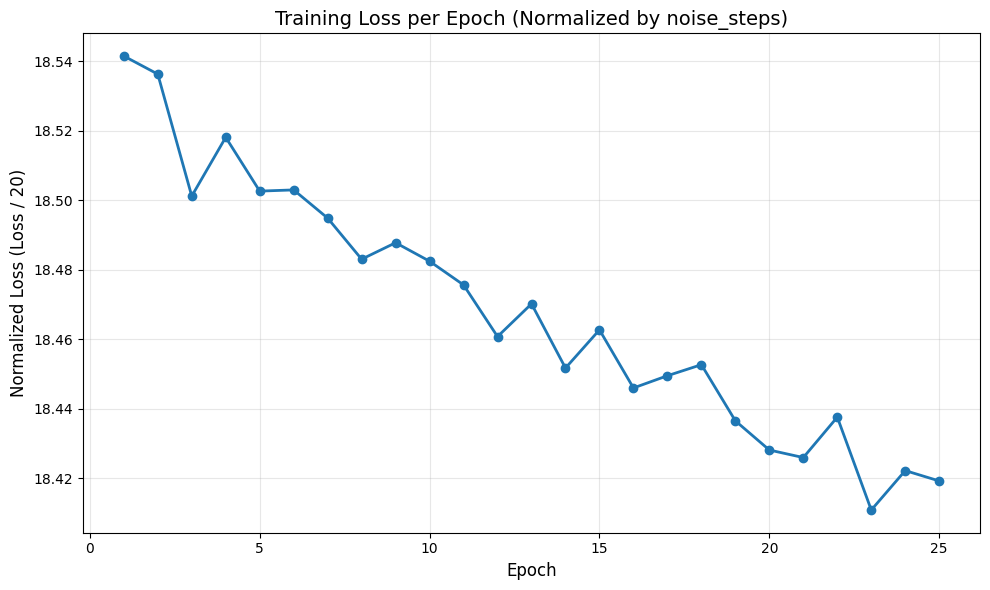


Loss Statistics:
Initial Loss: 18.5415
Final Loss: 18.4192
Total Reduction: 0.1223
Percentage Reduction: 0.66%


In [15]:
normalized_losses = [loss / noise_steps for loss in epoch_losses]

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(normalized_losses) + 1), normalized_losses, marker='o', linewidth=2, markersize=6)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel(f'Normalized Loss (Loss / {noise_steps})', fontsize=12)
plt.title('Training Loss per Epoch (Normalized by noise_steps)', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nLoss Statistics:")
print(f"Initial Loss: {normalized_losses[0]:.4f}")
print(f"Final Loss: {normalized_losses[-1]:.4f}")
print(f"Total Reduction: {normalized_losses[0] - normalized_losses[-1]:.4f}")
print(f"Percentage Reduction: {((normalized_losses[0] - normalized_losses[-1]) / normalized_losses[0] * 100):.2f}%")

In [16]:
from scipy.spatial.distance import pdist
from scipy.ndimage import laplace, sobel

def generate_samples_for_metrics(model, noise_steps, num_samples=100):
  """Generate samples for metric calculation."""
  model.eval()
  with torch.no_grad():
    noisy_images = unit_normal.sample((num_samples, 1, 28, 28)) * np.sqrt(noise_steps)
    labels = torch.randint(0, 10, (num_samples,)).to(device)

    for noise_step in range(noise_steps):
      noise_level = noise_steps - noise_step - 1
      noise = model(noisy_images, noise_level, labels)
      noisy_images -= noise

    generated_images = noisy_images.cpu().squeeze().numpy()

  model.train()
  return generated_images

def calculate_diversity_metric(generated_images):
  """Calculate diversity using pairwise distances."""
  flattened = generated_images.reshape(len(generated_images), -1)
  distances = pdist(flattened, metric='euclidean')
  avg_pairwise_distance = np.mean(distances)
  pixel_variance = np.var(generated_images, axis=0).mean()

  return {
    'avg_pairwise_distance': avg_pairwise_distance,
    'pixel_variance': pixel_variance
  }

def calculate_sharpness_metric(generated_images):
  """Calculate sharpness using Laplacian and gradient."""
  laplacian_vars = []
  gradient_mags = []

  for img in generated_images:
    # Normalize to 0-255
    img_uint8 = (np.clip(img, 0, 1) * 255).astype(np.float64)

    # Laplacian variance
    laplacian_img = laplace(img_uint8)
    laplacian_vars.append(np.var(laplacian_img))

    # Gradient magnitude using Sobel
    grad_x = sobel(img_uint8, axis=1)
    grad_y = sobel(img_uint8, axis=0)
    gradient_mag = np.sqrt(grad_x**2 + grad_y**2).mean()
    gradient_mags.append(gradient_mag)

  return {
    'laplacian_variance': np.mean(laplacian_vars),
    'laplacian_std': np.std(laplacian_vars),
    'gradient_magnitude': np.mean(gradient_mags),
    'gradient_std': np.std(gradient_mags)
  }

# Generate and evaluate
print("Generating samples for metrics...")
generated_samples = generate_samples_for_metrics(model, noise_steps, num_samples=100)

print("\n" + "="*50)
print("DIVERSITY METRICS")
print("="*50)
diversity_metrics = calculate_diversity_metric(generated_samples)
print(f"Average Pairwise Distance: {diversity_metrics['avg_pairwise_distance']:.4f}")
print(f"Pixel Variance: {diversity_metrics['pixel_variance']:.6f}")

print("\n" + "="*50)
print("SHARPNESS METRICS")
print("="*50)
sharpness_metrics = calculate_sharpness_metric(generated_samples)
print(f"Laplacian Variance (mean): {sharpness_metrics['laplacian_variance']:.4f}")
print(f"Laplacian Variance (std): {sharpness_metrics['laplacian_std']:.4f}")
print(f"Gradient Magnitude (mean): {sharpness_metrics['gradient_magnitude']:.4f}")
print(f"Gradient Magnitude (std): {sharpness_metrics['gradient_std']:.4f}")

# Compare with real data
print("\n" + "="*50)
print("COMPARISON WITH REAL DATA")
print("="*50)
real_images, _ = next(iter(train_loader))
real_images_np = real_images[:100].squeeze().numpy()

real_diversity = calculate_diversity_metric(real_images_np)
real_sharpness = calculate_sharpness_metric(real_images_np)

print(f"\nReal Data - Pairwise Distance: {real_diversity['avg_pairwise_distance']:.4f}")
print(f"Real Data - Laplacian Variance: {real_sharpness['laplacian_variance']:.4f}")

print(f"\nDiversity Ratio: {diversity_metrics['avg_pairwise_distance'] / real_diversity['avg_pairwise_distance']:.4f}")
print(f"Sharpness Ratio: {sharpness_metrics['laplacian_variance'] / real_sharpness['laplacian_variance']:.4f}")

Generating samples for metrics...

DIVERSITY METRICS
Average Pairwise Distance: 9.3373
Pixel Variance: 0.055634

SHARPNESS METRICS
Laplacian Variance (mean): 23835.1630
Laplacian Variance (std): 8300.6862
Gradient Magnitude (mean): 135.4586
Gradient Magnitude (std): 20.4639

COMPARISON WITH REAL DATA

Real Data - Pairwise Distance: 11.2684
Real Data - Laplacian Variance: 10412.5036

Diversity Ratio: 0.8286
Sharpness Ratio: 2.2891


## Code changes
We have reused the code from the demo given in the assignment. The changes we have made are :
- We are using the FashionMNIST dataset instead of the MNIST
- After experimenting a little, I arrived at the learning rate 0.001, which I believe is more suited to the training here than some higher learning rates

## Visualization

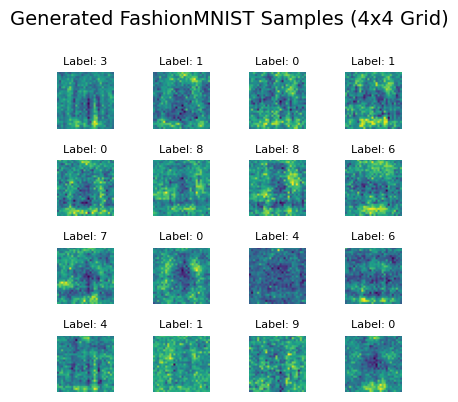

In [ ]:
def generate_grid(model, noise_steps, grid_size=4):

  num_samples = grid_size * grid_size

  noisy_images = unit_normal.sample((num_samples, 1, 28, 28)) * np.sqrt(noise_steps)

  labels = torch.randint(0, 10, (num_samples,)).to(device)

  for noise_step in range(noise_steps):
    noise_level = noise_steps - noise_step - 1
    with torch.no_grad():
      noise = model(noisy_images, noise_level, labels)
    noisy_images -= noise

  generated_images = noisy_images.cpu().squeeze().numpy()

  fig, axes = plt.subplots(grid_size, grid_size, figsize=(4, 4))
  fig.suptitle('Generated FashionMNIST Samples (4x4 Grid)', fontsize=14, y=0.995)

  for i in range(grid_size):
    for j in range(grid_size):
      idx = i * grid_size + j
      axes[i, j].imshow(generated_images[idx])
      axes[i, j].axis('off')
      axes[i, j].set_title(f'Label: {labels[idx].item()}', fontsize=8)

  plt.tight_layout()
  plt.show()

generate_grid(model, noise_steps, grid_size=4)

### Sample Quality

The images seem to be taking shape, we can see outlines of objects forming, but they are not discernible into solid objects by the naked eye. The images still appear to be extremely noisy instead of any object.

## (b) Ablation : Time steps.
Comparing T = 100 and T = 500<br>
We will compare two different values of noise_steps variable. This stands for the number of steps in which the noise is added into the image, and it is subsequently removed during the generation. <br>
We will compare values T = 100 and T = 500

T = 100

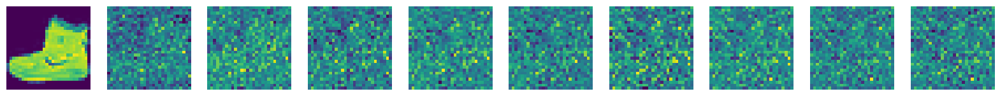

In [ ]:
images, labels = next(iter(train_loader))
noisy_images = images

# The two hyperparameters we are choosing.
sigma = .35 # standard deviation
noise_steps = 100 # number of steps we apply noise

# Showing images at regular intervals
plt.figure(figsize=(noise_steps * 2 / 10, 10))
for i in range(noise_steps):
  # Draw noise from a normal distribution with standard deviation sigma.
  noise = torch.normal(0, sigma, images.shape)
  if i % 10 == 0:
    plt.subplot(1,noise_steps//10,i//10+1)
    plt.imshow(noisy_images[0].squeeze())
    plt.axis('off')
  # Add the noise to the image.
  noisy_images = noise + noisy_images

In [ ]:
num_epochs=25
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Diffuser(sigma, noise_steps).to(device)
optimizer = torch.optim.Adam(model.parameters(), 0.01)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.5, total_iters=num_epochs)

/tmp/ipython-input-1035570508.py:8: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  less_noisy = images + unit_normal.sample(images.shape) * np.sqrt(noise_level)


Epoch: 0 	 Loss: 2533.4929199144244


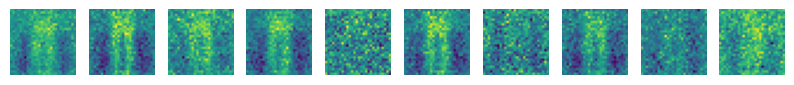

Epoch: 1 	 Loss: 2425.2593106795102


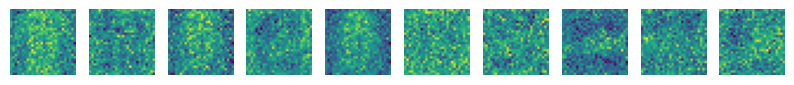

Epoch: 2 	 Loss: 2410.6166721992195


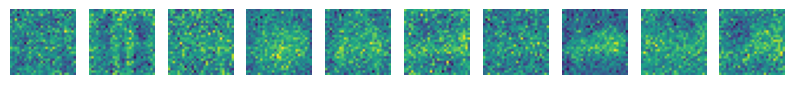

Epoch: 3 	 Loss: 2404.338261509314


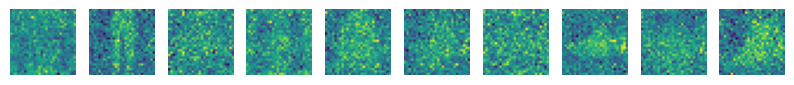

Epoch: 4 	 Loss: 2399.694189457223


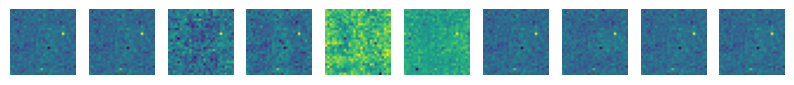

Epoch: 5 	 Loss: 2396.792512504384


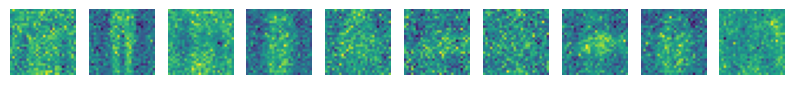

Epoch: 6 	 Loss: 2394.3515384197235


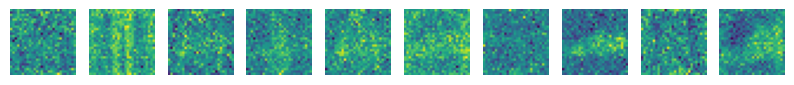

Epoch: 7 	 Loss: 2392.198506500572


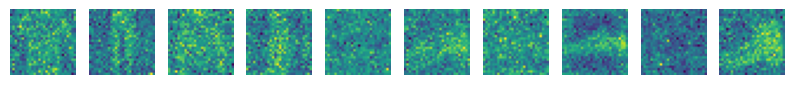

Epoch: 8 	 Loss: 2391.408708617091


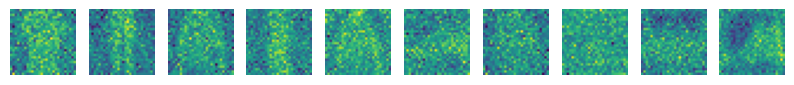

Epoch: 9 	 Loss: 2389.257223498076


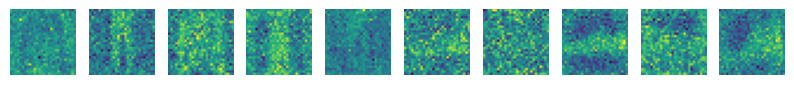

Epoch: 10 	 Loss: 2388.135191904381


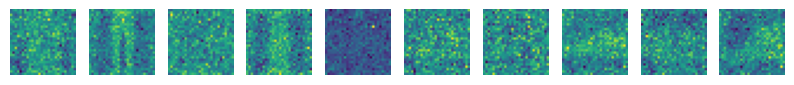

Epoch: 11 	 Loss: 2387.3699220642447


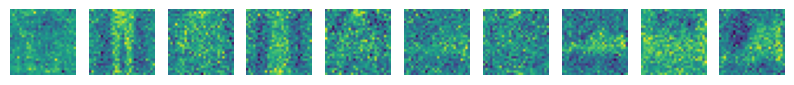

Epoch: 12 	 Loss: 2386.2075882405043


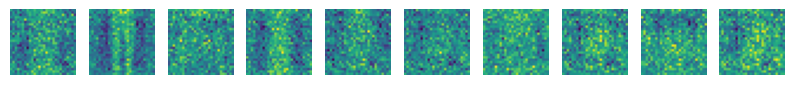

Epoch: 13 	 Loss: 2385.1665039081126


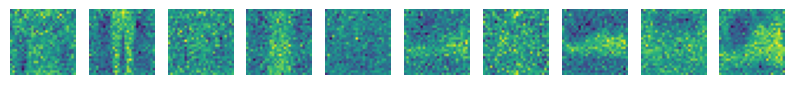

Epoch: 14 	 Loss: 2384.7047338541597


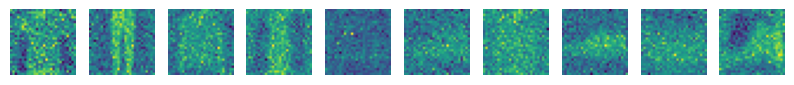

Epoch: 15 	 Loss: 2383.6435331646353


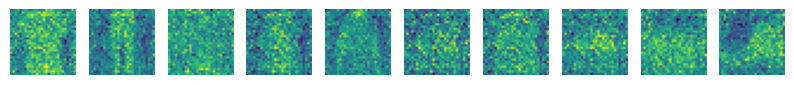

Epoch: 16 	 Loss: 2382.9456024318933


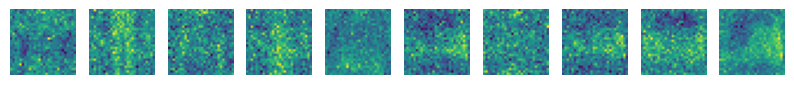

Epoch: 17 	 Loss: 2382.7821958884597


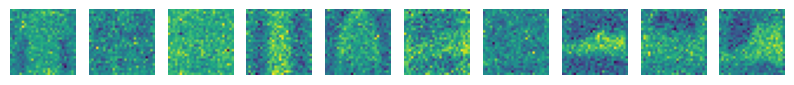

Epoch: 18 	 Loss: 2381.85945353657


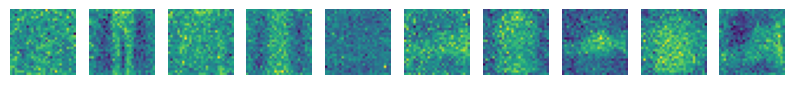

Epoch: 19 	 Loss: 2382.0690107438713


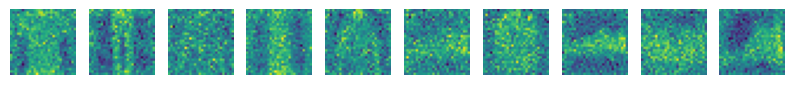

Epoch: 20 	 Loss: 2381.3130593579262


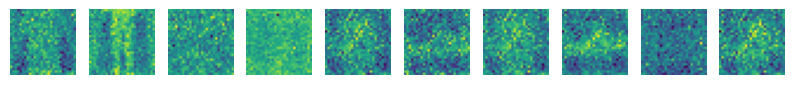

Epoch: 21 	 Loss: 2380.542709104717


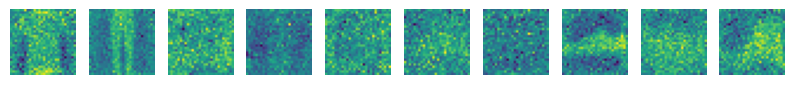

Epoch: 22 	 Loss: 2380.7596270870417


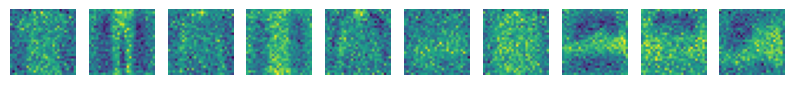

Epoch: 23 	 Loss: 2380.461301373318


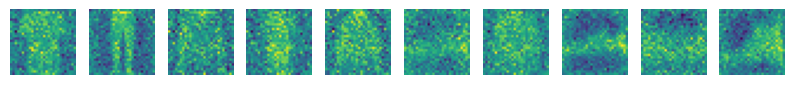

Epoch: 24 	 Loss: 2380.24804520607


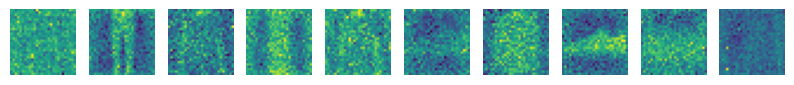

In [ ]:
losses_100 = []

for epoch in range(num_epochs):
  epoch_loss = 0
  i = 0
  for images, labels in train_loader:
    i = i+1
    images = images.to(device)
    for noise_level in torch.randperm(noise_steps):
      less_noisy = images + unit_normal.sample(images.shape) * np.sqrt(noise_level)
      one_step_noise = unit_normal.sample(images.shape)
      more_noisy = less_noisy + one_step_noise
      output = model(more_noisy, noise_level, labels)
      loss = criterion(output, one_step_noise)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      epoch_loss += loss.item()
  losses_100.append(epoch_loss)
  print(f'Epoch: {epoch} \t Loss: {epoch_loss}')
  evaluate(model, noise_steps)

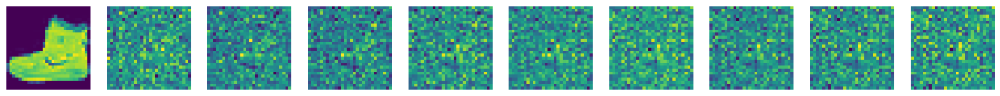

In [ ]:
images, labels = next(iter(train_loader))
noisy_images = images

sigma = .35
noise_steps = 500

plt.figure(figsize=(noise_steps * 2 / 50, 10))
for i in range(noise_steps):
  noise = torch.normal(0, sigma, images.shape)
  if i % 50 == 0:
    plt.subplot(1,noise_steps//50,i//50+1)
    plt.imshow(noisy_images[0].squeeze())
    plt.axis('off')
  noisy_images = noise + noisy_images

T = 500

In [ ]:
num_epochs=25
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Diffuser(sigma, noise_steps).to(device)
optimizer = torch.optim.Adam(model.parameters(), 0.01)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.5, total_iters=num_epochs)

/tmp/ipython-input-4061166160.py:11: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  less_noisy = images + unit_normal.sample(images.shape) * np.sqrt(noise_level)


Epoch: 0 	 Loss: 13453.60910738632


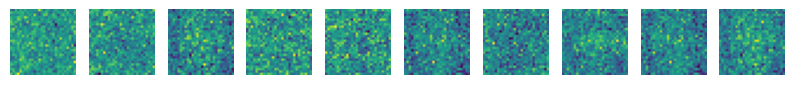

Epoch: 1 	 Loss: 13345.70900132507


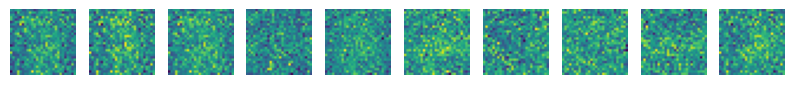

Epoch: 2 	 Loss: 13326.164867810905


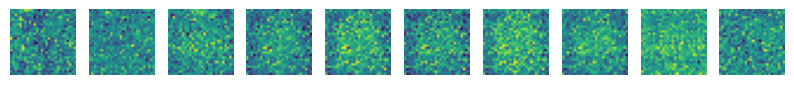

Epoch: 3 	 Loss: 13314.743495360017


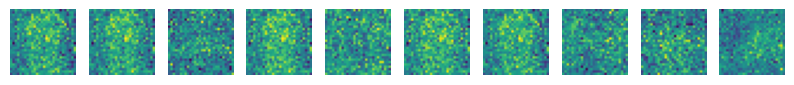

Epoch: 4 	 Loss: 13307.241218348965


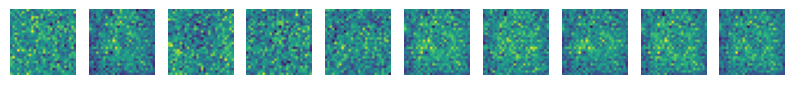

Epoch: 5 	 Loss: 13301.418489884585


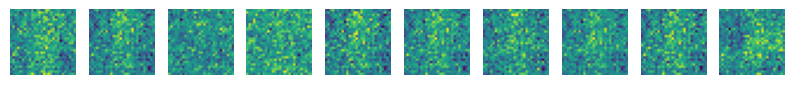

Epoch: 6 	 Loss: 13297.11495565623


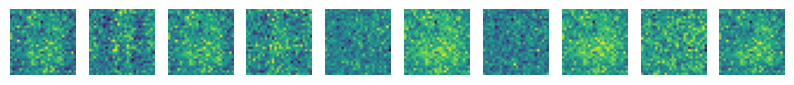

Epoch: 7 	 Loss: 13293.48883113265


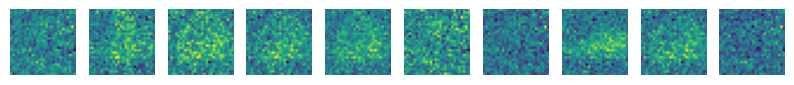

Epoch: 8 	 Loss: 13290.82423208654


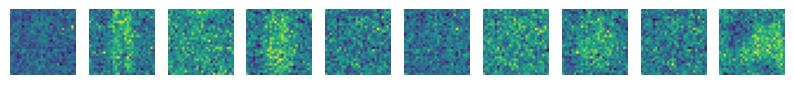

Epoch: 9 	 Loss: 13287.923706952482


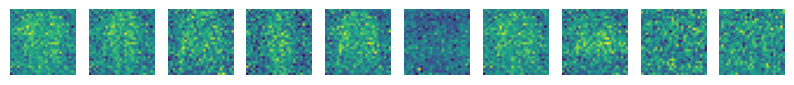

Epoch: 10 	 Loss: 13285.116753512993


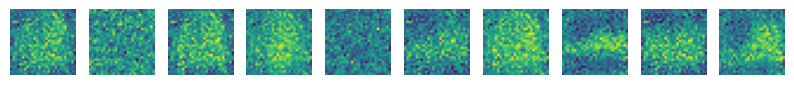

Epoch: 11 	 Loss: 13282.938867030665


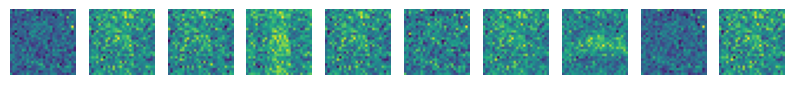

Epoch: 12 	 Loss: 13282.433307576925


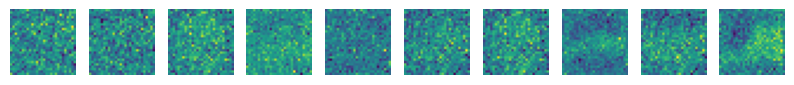

Epoch: 13 	 Loss: 13280.45494509302


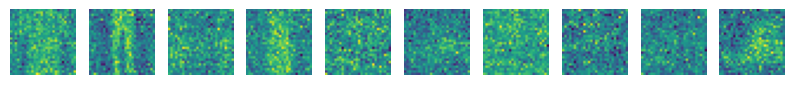

Epoch: 14 	 Loss: 13278.191609531641


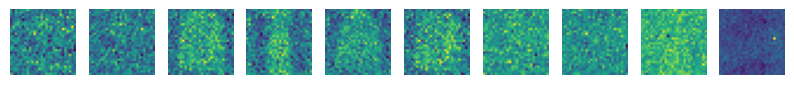

Epoch: 15 	 Loss: 13276.921143956482


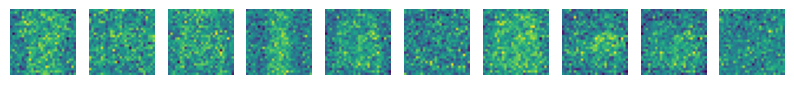

Epoch: 16 	 Loss: 13275.71819072403


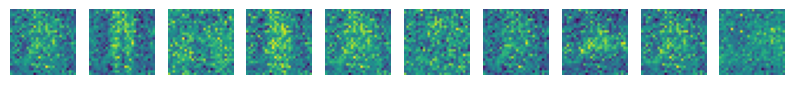

Epoch: 17 	 Loss: 13274.84926401265


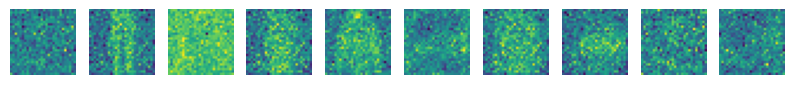

Epoch: 18 	 Loss: 13273.530244397


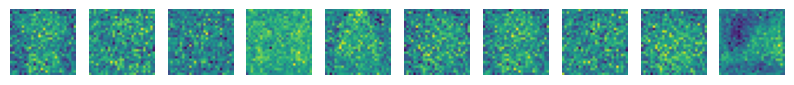

Epoch: 19 	 Loss: 13272.253444775939


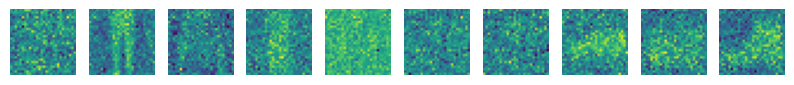

Epoch: 20 	 Loss: 13271.8841352202


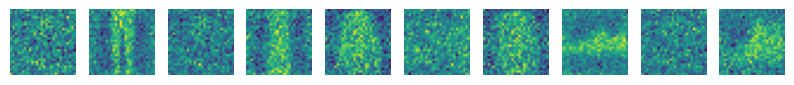

Epoch: 21 	 Loss: 13270.987496079877


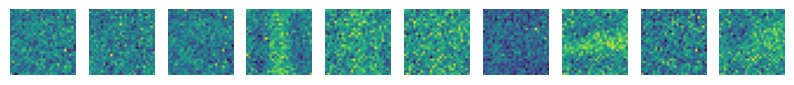

Epoch: 22 	 Loss: 13269.02448179014


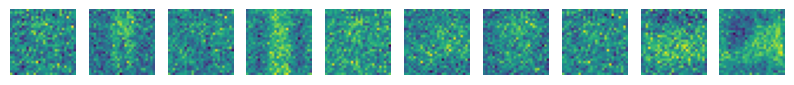

Epoch: 23 	 Loss: 13269.35957349278


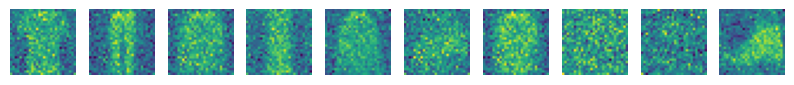

Epoch: 24 	 Loss: 13267.143366450444


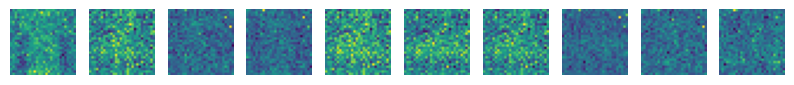

In [ ]:
losses_500 = []

for epoch in range(num_epochs):
  epoch_loss = 0
  i = 0
  for images, labels in train_loader:
    i = i+1
    images = images.to(device)
    for noise_level in torch.randperm(noise_steps):
      less_noisy = images + unit_normal.sample(images.shape) * np.sqrt(noise_level)
      one_step_noise = unit_normal.sample(images.shape)
      more_noisy = less_noisy + one_step_noise
      output = model(more_noisy, noise_level, labels)
      loss = criterion(output, one_step_noise)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      epoch_loss += loss.item()
  losses_500.append(epoch_loss)
  print(f'Epoch: {epoch} \t Loss: {epoch_loss}')
  evaluate(model, noise_steps)

## Training loss plots for both the settings
Before plotting the losses, we normalize them to get a fair comparison of losses per noise_step

In [ ]:

losses_100 = np.array(losses_100)
losses_500 = np.array(losses_500)

losses_100 = losses_100 / 100
losses_500 = losses_500 / 500

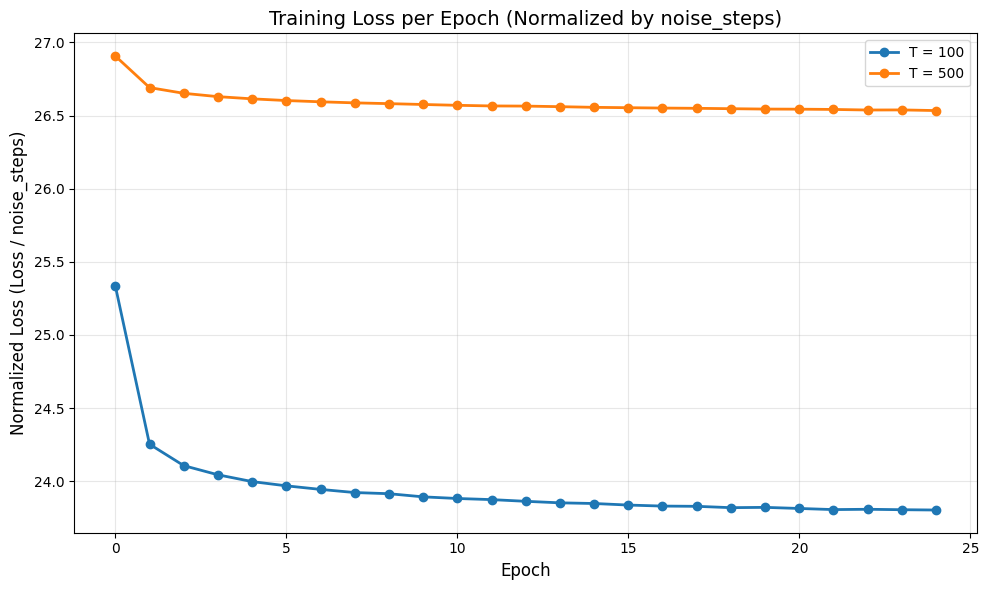

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(losses_100, marker='o', linewidth=2, markersize=6)
plt.plot(losses_500, marker='o', linewidth=2, markersize=6)

plt.legend(['T = 100', 'T = 500'])
plt.xlabel('Epoch', fontsize=12)
plt.ylabel(f'Normalized Loss (Loss / noise_steps)', fontsize=12)
plt.title('Training Loss per Epoch (Normalized by noise_steps)', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Visualizing results with T = 100 and T = 500

T = 100

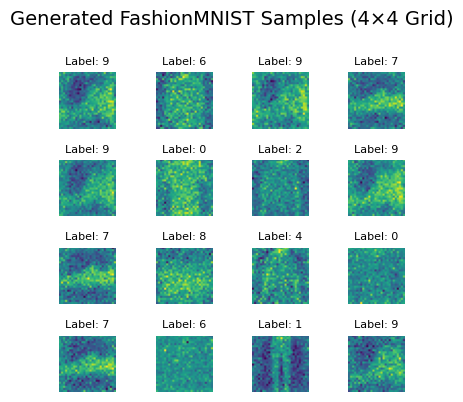

In [ ]:
def generate_grid(model, noise_steps, grid_size=4):

  num_samples = grid_size * grid_size

  noisy_images = unit_normal.sample((num_samples, 1, 28, 28)) * np.sqrt(noise_steps)

  labels = torch.randint(0, 10, (num_samples,)).to(device)

  for noise_step in range(noise_steps):
    noise_level = noise_steps - noise_step - 1
    with torch.no_grad():
      noise = model(noisy_images, noise_level, labels)
    noisy_images -= noise

  generated_images = noisy_images.cpu().squeeze().numpy()

  fig, axes = plt.subplots(grid_size, grid_size, figsize=(4, 4))
  fig.suptitle('Generated FashionMNIST Samples (4x4 Grid)', fontsize=14, y=0.995)

  for i in range(grid_size):
    for j in range(grid_size):
      idx = i * grid_size + j
      axes[i, j].imshow(generated_images[idx])
      axes[i, j].axis('off')
      axes[i, j].set_title(f'Label: {labels[idx].item()}', fontsize=8)

  plt.tight_layout()
  plt.show()

generate_grid(model, noise_steps, grid_size=4)

T = 500

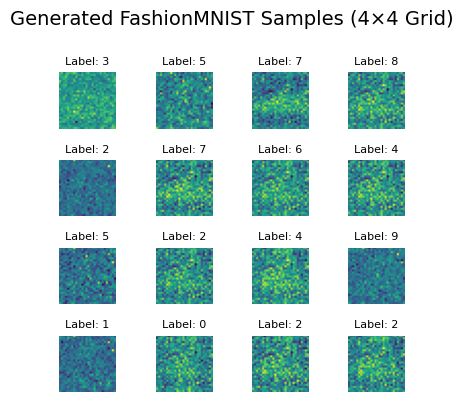

In [ ]:
def generate_grid(model, noise_steps, grid_size=4):

  num_samples = grid_size * grid_size

  noisy_images = unit_normal.sample((num_samples, 1, 28, 28)) * np.sqrt(noise_steps)

  labels = torch.randint(0, 10, (num_samples,)).to(device)

  for noise_step in range(noise_steps):
    noise_level = noise_steps - noise_step - 1
    with torch.no_grad():
      noise = model(noisy_images, noise_level, labels)
    noisy_images -= noise

  generated_images = noisy_images.cpu().squeeze().numpy()

  fig, axes = plt.subplots(grid_size, grid_size, figsize=(4, 4))
  fig.suptitle('Generated FashionMNIST Samples (4x4 Grid)', fontsize=14, y=0.995)

  for i in range(grid_size):
    for j in range(grid_size):
      idx = i * grid_size + j
      axes[i, j].imshow(generated_images[idx])
      axes[i, j].axis('off')
      axes[i, j].set_title(f'Label: {labels[idx].item()}', fontsize=8)

  plt.tight_layout()
  plt.show()

generate_grid(model, noise_steps, grid_size=4)

### Comparison of results

(T=100) gives much better training and sample quality compared to (T=500). When T is too large, each step adds only a very small amount of noise, which makes the denoising task harder because the model has to learn to predict extremely fine-grained noise levels at every step. It was discussed in the lecture that, diffusion works best when each noisy sample lies only slightly off the data sample. This let's the model reliably move it back through meaningful corrections. With an excessively large number of steps, these corrections become very weak and hard to learn. This leads to slower convergence and reduced sample quality. That is why, keeping a moderate T, like T = 100 provided a more effective balance between noise level and denoising difficulty over a large T, like T = 500.

## (c) Writeup

### GAN results

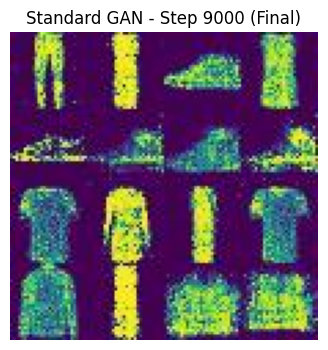

In [ ]:
# Final generation
try:
    img = mpimg.imread('samples_standard/StandardGAN_step9000.jpg')
    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.title('Standard GAN - Step 9000 (Final)')
    plt.axis('off')
    plt.show()
except:
    print("Step 9000 image not yet generated. Continue training or check available step numbers.")


### Diffusion results

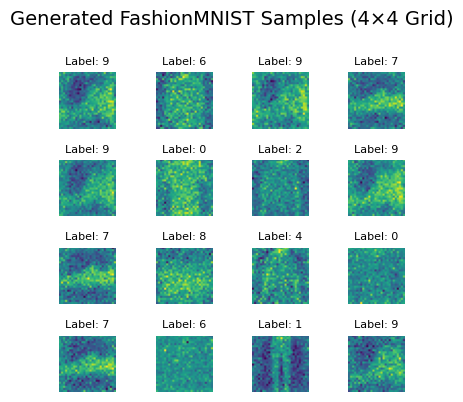

In [ ]:
def generate_grid(model, noise_steps, grid_size=4):

  num_samples = grid_size * grid_size

  noisy_images = unit_normal.sample((num_samples, 1, 28, 28)) * np.sqrt(noise_steps)

  labels = torch.randint(0, 10, (num_samples,)).to(device)

  for noise_step in range(noise_steps):
    noise_level = noise_steps - noise_step - 1
    with torch.no_grad():
      noise = model(noisy_images, noise_level, labels)
    noisy_images -= noise

  generated_images = noisy_images.cpu().squeeze().numpy()

  fig, axes = plt.subplots(grid_size, grid_size, figsize=(4, 4))
  fig.suptitle('Generated FashionMNIST Samples (4x4 Grid)', fontsize=14, y=0.995)

  for i in range(grid_size):
    for j in range(grid_size):
      idx = i * grid_size + j
      axes[i, j].imshow(generated_images[idx])
      axes[i, j].axis('off')
      axes[i, j].set_title(f'Label: {labels[idx].item()}', fontsize=8)

  plt.tight_layout()
  plt.show()

generate_grid(model, noise_steps, grid_size=4)

Both the methods, GAN and Diffusion were around equally challenging to tune, to find the hyperparameters. GANs usually focus on factors like learning rates, batch size, and network architecture for their performance that can be tuned. While Diffusion models have some other hyperparameters like Noise schedule and number of timesteps that need to be tweaked. In this assignment, the architecture was mostly kept the same as the Conditional GAN, except the input layer did not take the encoded label vector as additional help to direct the model. For the Diffusion model, different learning rates were used before settling down, and a ablation experiment was performed to compare the performance between T = 100 and T = 500.

The Sharpness and Diversity achieved in GANs is:

SHARPNESS<br>
Laplacian Variance (mean): 21187.2653<br>
Laplacian Variance (std): 8458.7522<br>
Gradient Magnitude (mean): 199.3631<br>
Gradient Magnitude (std): 47.9669<br>

DIVERSITY<br>
Average Pairwise Distance: 10.9312<br>
Pixel Variance: 0.081251<br>

Sharpness and Diversity achieved by Diffusion model

SHARPNESS<br>
Laplacian Variance (mean): 23835.1630<br>
Laplacian Variance (std): 8300.6862<br>
Gradient Magnitude (mean): 135.4586<br>
Gradient Magnitude (std): 20.4639<br>

DIVERSITY<br>
Average Pairwise Distance: 9.3373<br>
Pixel Variance: 0.055634<br>

From a theoretical standpoint, GANs and Diffusion models are fundamentally different in how they define their learning objectives and optimize it. GANs rely on a minimax adversarial optimization regime between a generator and a discriminator. This often leads to unstable training dynamics and makes the balance between sharpness and diversity difficult to control. This adversarial nature of algorithm can produce outputs with high contrast which might make the images look sharper, but also introduces variability and occasional artifacts. this can be seen sometimes in the comparatively higher pixel-level diversity in the GAN results.

While Diffusion models, optimize a fixed supervised noise-prediction loss, while framing generation as a series of denoising steps. This produces much more stable training and naturally images, even if the raw pixel diversity is slightly lower.